## Set Up

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, AffinityPropagation, MeanShift, SpectralClustering, AgglomerativeClustering, DBSCAN, HDBSCAN, OPTICS, Birch, BisectingKMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

# https://scikit-learn.org/stable/modules/clustering.html#k-means

In [32]:
# Set random seed.
SEED = 42

## Load Data and Extract Features

In [33]:
# Load data
df = pd.read_csv('../../1-datasets/_integrated-data/annual-asthma/data-merged.csv')

# Set the feature columns
features = df.drop(columns=['financial year', 'lhd'])
x_columns = features.iloc[:, 6:]
y_columns = features.iloc[:, :6]

# Normalize the data
x_columns = (x_columns - x_columns.mean()) / x_columns.std()


## Visualize Raw Data

C:\Users\matth\AppData\Local\Temp\ipykernel_19972\115967500.py:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(df[x_col], df[y_col], cmap='viridis')


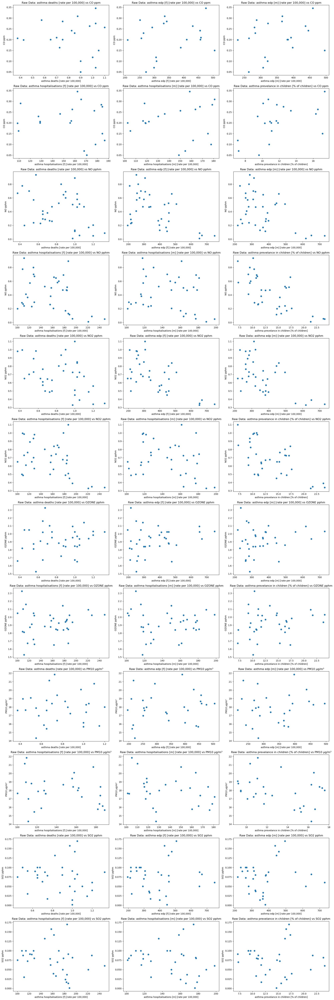

In [34]:
# Visualize Raw Data
plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'Raw Data: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## KMeans

c:\Users\matth\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


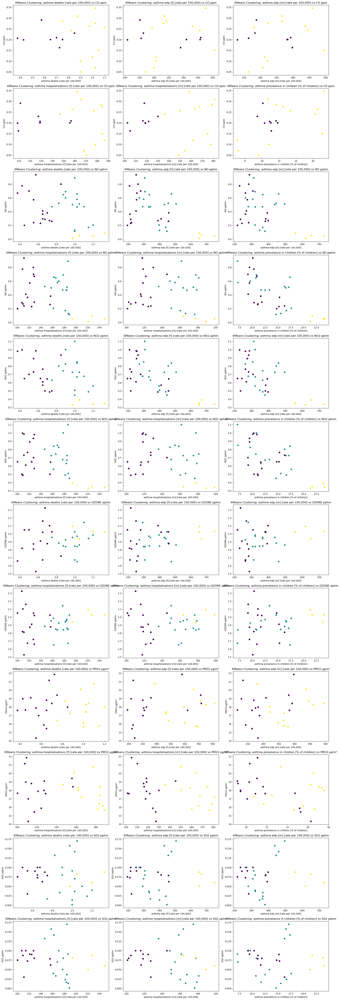

In [35]:
kmeans = KMeans(n_clusters=3, random_state=SEED)
df['cluster'] = kmeans.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'KMeans Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## Affinity Propagation

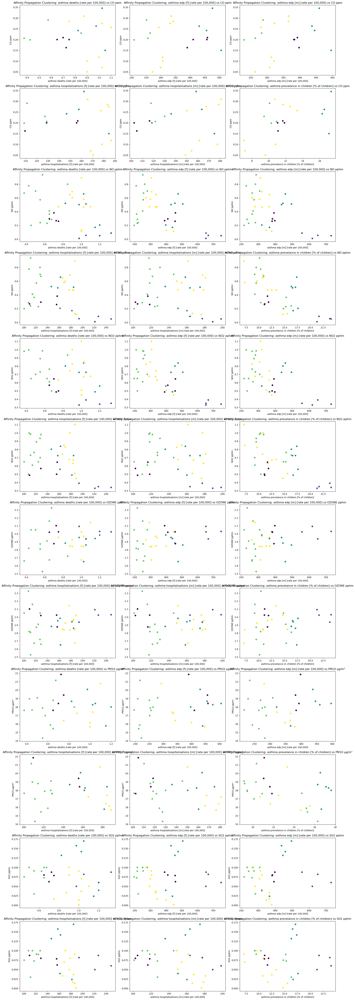

In [36]:
affinity_propagation = AffinityPropagation(random_state=SEED)
df['affinity_cluster'] = affinity_propagation.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['affinity_cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'Affinity Propagation Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## Mean Shift

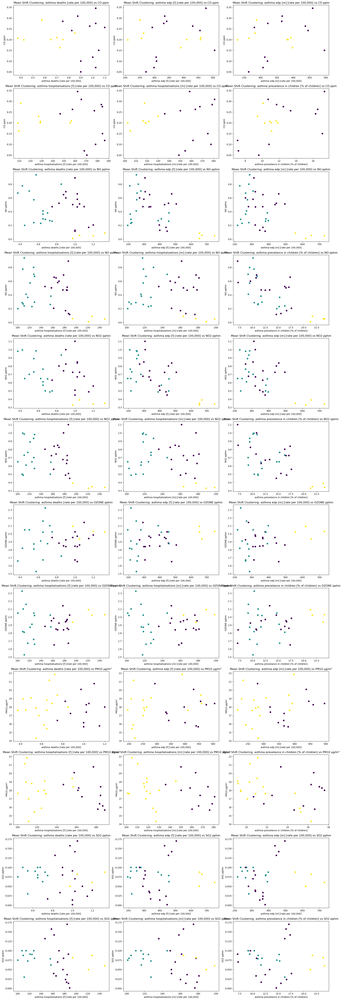

In [37]:
mean_shift = MeanShift()
df['mean_shift_cluster'] = mean_shift.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['mean_shift_cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'Mean Shift Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## Spectral Clustering

c:\Users\matth\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


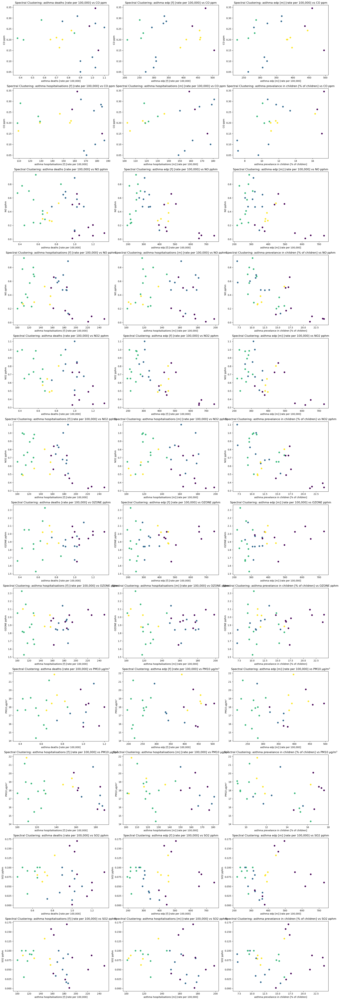

In [39]:
spectral_clustering = SpectralClustering(n_clusters=4, random_state=SEED, affinity='nearest_neighbors')
df['spectral_cluster'] = spectral_clustering.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['spectral_cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'Spectral Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## Agglomerative Clustering

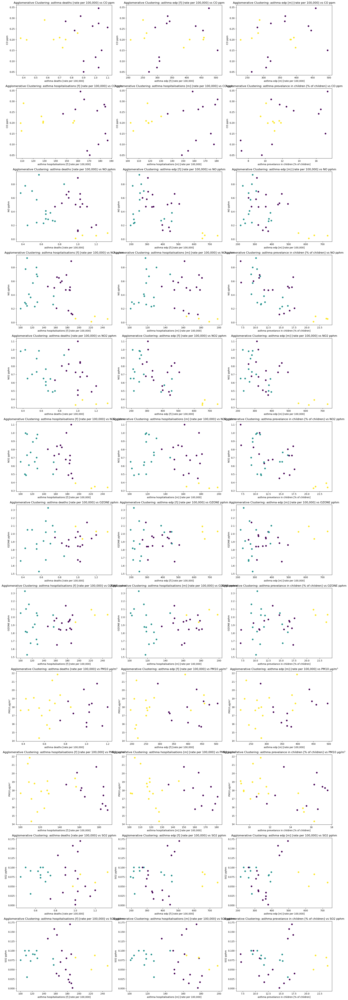

In [40]:
agg_clustering = AgglomerativeClustering(n_clusters=3)
df['agg_cluster'] = agg_clustering.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['agg_cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'Agglomerative Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## DBSCAN

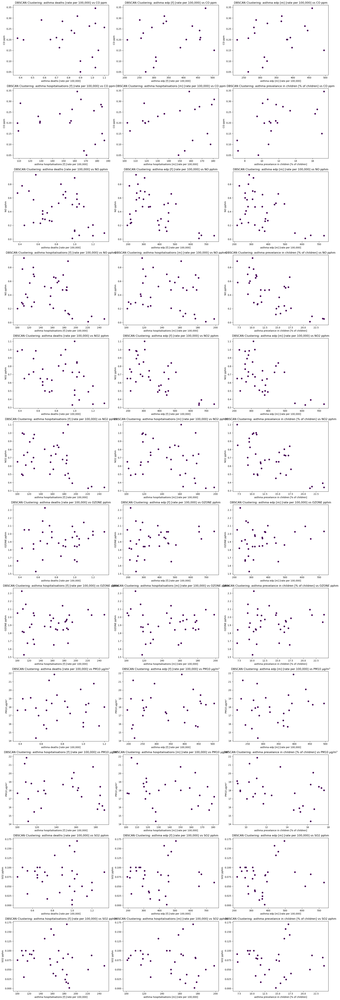

In [41]:
dbscan = DBSCAN(eps=0.5, min_samples=5)
df['dbscan_cluster'] = dbscan.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['dbscan_cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'DBSCAN Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## HDBSCAN

In [42]:
# unsure how to use HDBSCAN

## OPTICS

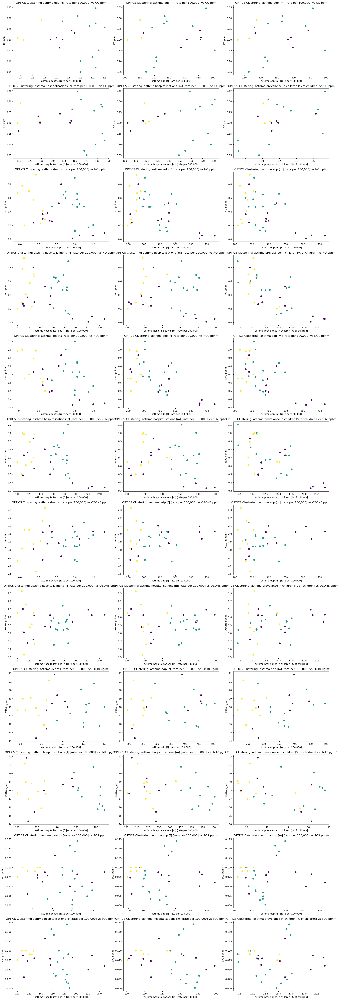

In [43]:
optics = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.1)
df['optics_cluster'] = optics.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['optics_cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'OPTICS Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## Birch

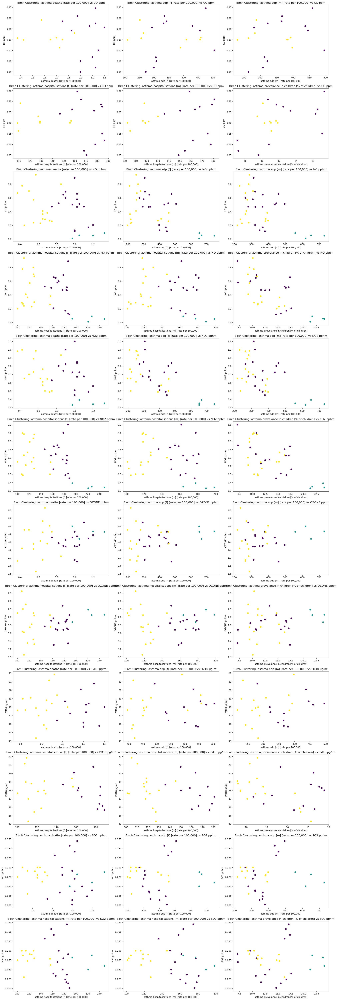

In [44]:
birch = Birch(n_clusters=3)
df['birch_cluster'] = birch.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['birch_cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'Birch Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## Bisecting KMeans

c:\Users\matth\anaconda3\Lib\site-packages\sklearn\cluster\_bisect_k_means.py:246: UserWarning: BisectingKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


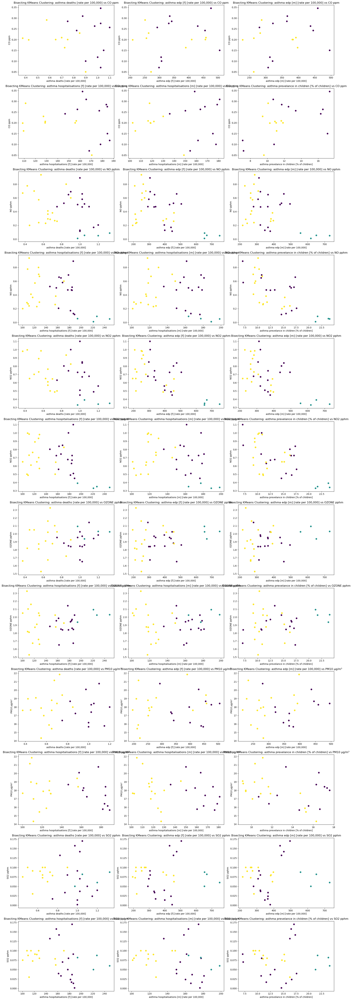

In [45]:
bisecting_kmeans = BisectingKMeans(n_clusters=3, random_state=42)
df['bisecting_kmeans_cluster'] = bisecting_kmeans.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['bisecting_kmeans_cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'Bisecting KMeans Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## Gaussian Mixture

c:\Users\matth\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


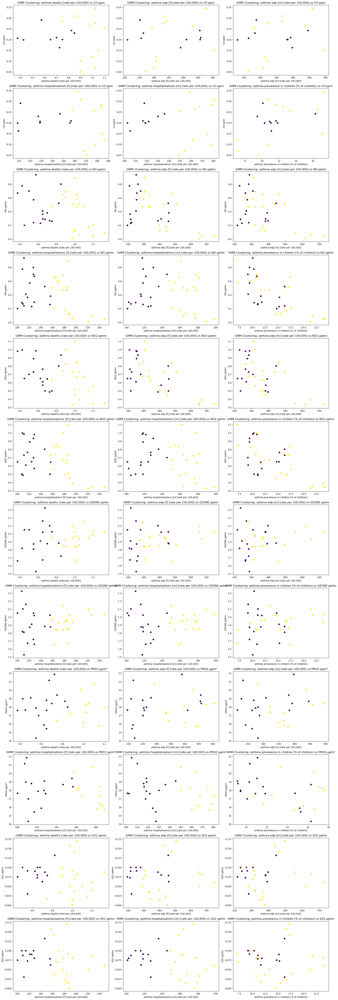

In [46]:
gmm = GaussianMixture(n_components=2, random_state=SEED)
df['gmm_cluster'] = gmm.fit_predict(x_columns)

plt.figure(figsize=(20, 60))
plot_number = 1

for y_col in y_columns:
    for x_col in x_columns:
        plt.subplot(int(len(y_columns) / 3), 3, plot_number)
        plt.scatter(df[x_col], df[y_col], c=df['gmm_cluster'], cmap='viridis')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(f'GMM Clustering: {x_col} vs {y_col}')
        plot_number += 1

plt.tight_layout()
plt.show()

## PCA

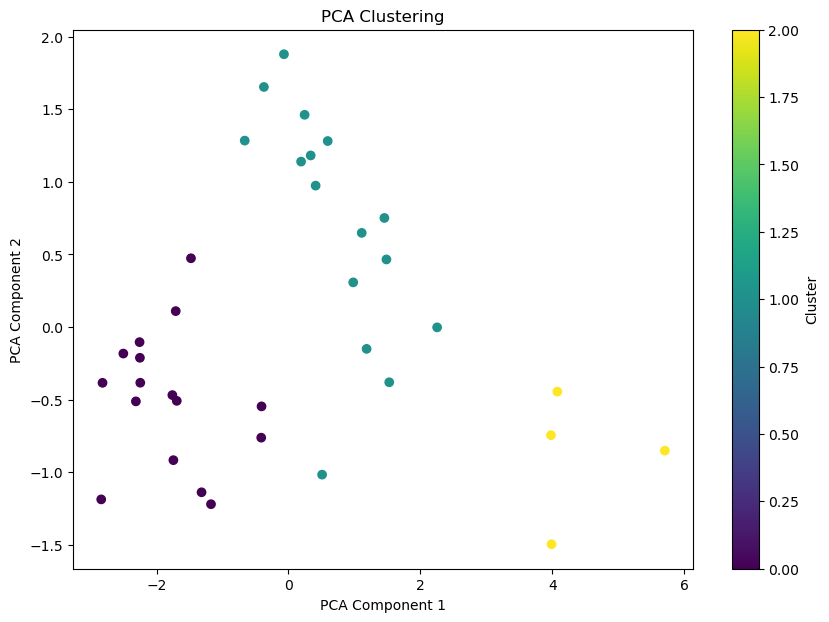

In [47]:
pca = PCA(n_components=4)
pca_features = pca.fit_transform(x_columns)

plt.figure(figsize=(10, 7))
plt.scatter(pca_features[:, 0], pca_features[:, 1], c=df['cluster'], cmap='viridis')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA Clustering')
plt.colorbar(label='Cluster')
plt.show()